# Voice conversion prototyping

with GMMs; ABIcorpus

In [1]:
# open data
from os.path import join, expanduser
DATA_ROOT = join(expanduser("~"), "Documents/em_lct/UoM/thesis/data/", "ABI-1")
!ls $DATA_ROOT

brm_001 ean_001 gla_001 lan_001 ncl_001 roi_001 sse_001
crn_001 eyk_001 ilo_001 lvp_001 nwa_001 shl_001 uls_001


In [2]:
# nnmnkwii imports taken from example notebook on VC
%pylab inline
rcParams["figure.figsize"] = (16,5)

from nnmnkwii.datasets import PaddedFileSourceDataset, FileDataSource
# from nnmnkwii.datasets.cmu_arctic import CMUArcticWavFileDataSource
from nnmnkwii.preprocessing.alignment import DTWAligner
from nnmnkwii.preprocessing import trim_zeros_frames, remove_zeros_frames, delta_features
from nnmnkwii.util import apply_each2d_trim
from nnmnkwii.metrics import melcd
from nnmnkwii.baseline.gmm import MLPG

from os import listdir
from os.path import basename, splitext, join, splitext, isdir
import sys
import time

import numpy as np
import pandas as pd
from scipy.io import wavfile
from scipy import signal
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
import pyworld
import pysptk
from pysptk.synthesis import MLSADF, Synthesizer
import librosa
import librosa.display
import IPython
from IPython.display import Audio

Populating the interactive namespace from numpy and matplotlib


In [3]:
fs = 16000
fftlen = pyworld.get_cheaptrick_fft_size(fs)
alpha = pysptk.util.mcepalpha(fs)
order = 24
frame_period = 5
hop_length = int(fs * (frame_period * 0.001))
max_files = 150 # number of utterances to be used.
test_size = 0.33
use_delta = True

if use_delta:
    windows = [
        (0, 0, np.array([1.0])),
        (1, 1, np.array([-0.5, 0.0, 0.5])),
        (1, 1, np.array([1.0, -2.0, 1.0])),
    ]
else:
    windows = [
        (0, 0, np.array([1.0])),
    ]

In [4]:
class ABIFileDataSource(FileDataSource):
    """Wav file data source for ABI.
    
    Code from https://r9y9.github.io/nnmnkwii/latest/_modules/nnmnkwii/datasets/cmu_arctic.html
    was modified for ABI corpus.

    The data source collects wav files from the ABI corpus after the audio files
    have been split and organized into separate folders for each 'experiment'. 
    (e.g. 'shortpassages' or 'cwa' through 'cwe')
    Users are expected to inherit the class and implement ``collect_features``
    method, which defines how features are computed given a wav file path.

    Args:
        data_root (str): Data root.
        speakers (list): List of speakers to find. 
        labelmap (dict[optional]): Dict of speaker labels. If None,
          it's assigned as incrementally (i.e., 0, 1, 2) for specified
          speakers.
        max_files (int): Total number of files to be collected.

    Attributes:
        labels (numpy.ndarray): Speaker labels paired with collected files.
          Stored in ``collect_files``. This is useful to build multi-speaker
          models.
    """
  
    def __init__(self, data_root, speakers, labelmap=None, max_files=None):
        self.data_root = data_root
        self.speakers = speakers
        if labelmap is None:
            labelmap = {}
            for idx, speaker in enumerate(speakers):
                labelmap[speaker] = idx
        self.labelmap = labelmap
        self.max_files = max_files
        self.labels = None
        self.test_paths = None
        self.train_paths = None

    def collect_files(self):
        speaker_dirs = list(
            map(lambda x: join(self.data_root, x),
                self.speakers))
        paths = []
        labels = []

        if self.max_files is None:
            max_files_per_speaker = None
        else:
            max_files_per_speaker = self.max_files // len(self.speakers)
        for (i, d) in enumerate(speaker_dirs):
            if not isdir(d):
                raise RuntimeError("{} doesn't exist.".format(d))
                
            paths_train = []
            paths_test = []
            for file in listdir(d): # for each file (wav, txt, directories) inside a speaker folder
                if isdir(join(d, file)):
                    if file.startswith('cw') or file.startswith('shortpassage'):
                        audio_files = listdir(join(speaker_dirs[i], file))
                        paths_train += [join(speaker_dirs[i], file, f) for f in audio_files]
                    if file.startswith('shortphrases') or file.startswith('shortsentences'):
                        audio_files = listdir(join(speaker_dirs[i], file))
                        paths_test += [join(speaker_dirs[i], file, f) for f in audio_files]
            
            paths_train = list(filter(lambda x: splitext(x)[1] == ".wav", paths_train))
            paths_train = sorted(paths_train)
            paths_test = list(filter(lambda x: splitext(x)[1] == ".wav", paths_test))
            paths_test = sorted(paths_test)
            
            # keep paths for later testing
            self.train_paths = paths_train
            self.test_paths = paths_test
            
            count = 0
            while count <= len(paths_train) + len(paths_test):
                labels.append(self.labelmap[self.speakers[i]])
                count += 1

        
        self.labels = np.array(labels, dtype=np.int32)    
        return paths_train

    def collect_features(self, path):
        x, frame_sample = librosa.load(path, sr=fs, dtype=float64)
        f0, timeaxis = pyworld.dio(x, frame_sample, frame_period=frame_period)
        f0 = pyworld.stonemask(x, f0, timeaxis, frame_sample)
        spectrogram = pyworld.cheaptrick(x, f0, timeaxis, frame_sample)
        spectrogram = trim_zeros_frames(spectrogram)
        mc = pysptk.sp2mc(spectrogram, order=order, alpha=alpha)
        return mc         

In [5]:
src_speaker = ABIFileDataSource(data_root=DATA_ROOT, speakers=["sse_001/female/sce001"])
tgt_speaker = ABIFileDataSource(data_root=DATA_ROOT, speakers=["lan_001/female/jxd001"])

In [6]:
# convert datasets into arrays
X = PaddedFileSourceDataset(src_speaker, 11000).asarray()
Y = PaddedFileSourceDataset(tgt_speaker, 11000).asarray()
print(X.shape)
print(Y.shape)

(142, 11000, 25)
(142, 11000, 25)


In [7]:
# Plotting util
def plot_parallel(x,y):
    figure(figsize=(16,7))
    subplot(2,1,1)
    librosa.display.specshow(trim_zeros_frames(x).T, sr=fs, hop_length=hop_length, x_axis="time")
    colorbar()
    subplot(2,1,2)
    librosa.display.specshow(trim_zeros_frames(y).T, sr=fs, hop_length=hop_length, x_axis="time")
    colorbar()

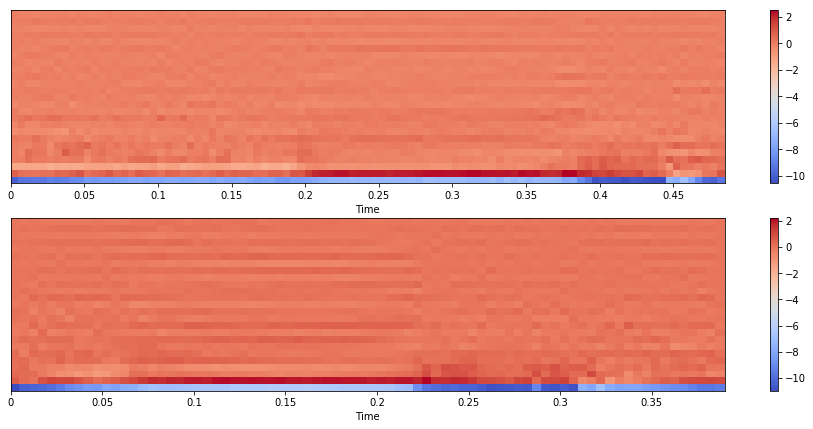

In [8]:
idx = 1 # any 
plot_parallel(X[idx],Y[idx])

In [9]:
# Alignment
X_aligned, Y_aligned = DTWAligner(verbose=0, dist=melcd).transform((X, Y))

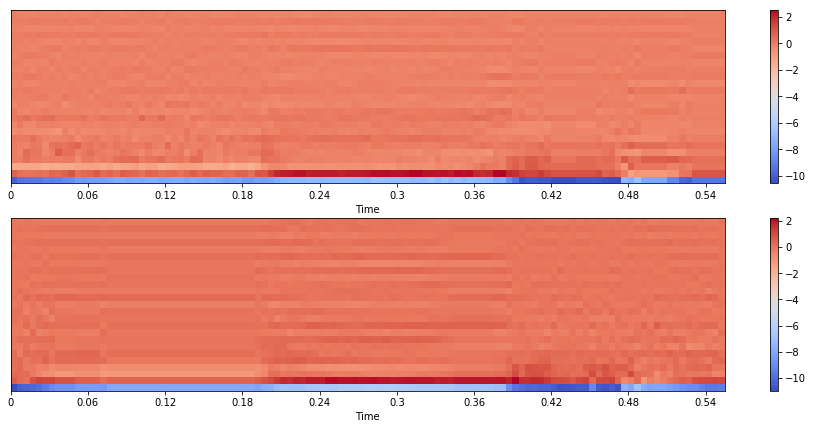

In [10]:
plot_parallel(X_aligned[idx],Y_aligned[idx])

In [11]:
# Drop 1st (power) dimension
X_aligned, Y_aligned = X_aligned[:, :, 1:], Y_aligned[:, :, 1:]

In [12]:
static_dim = X_aligned.shape[-1]
if use_delta:
    X_aligned = apply_each2d_trim(delta_features, X_aligned, windows)
    Y_aligned = apply_each2d_trim(delta_features, Y_aligned, windows)

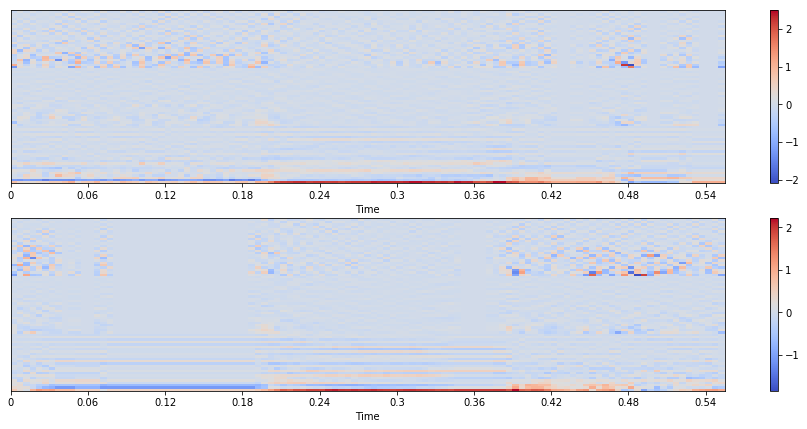

In [13]:
plot_parallel(X_aligned[idx],Y_aligned[idx])

## Kmeans clustering of MFCC feature vectors

### clustering of source speaker

In [14]:
km_X = KMeans(n_clusters=512, init='k-means++', max_iter=100, n_init=1)

In [15]:
X_aligned.shape

(142, 11000, 72)

In [16]:
# concatenates all of the frames in each sentence since k-means needs one large vector
all_frames_X = numpy.concatenate(X_aligned, axis=0)

In [17]:
# should equal number of frames * number of utterances
len(all_frames_X)

1562000

In [18]:
all_frames_X.shape

(1562000, 72)

In [19]:
all_frames_X[0]

array([ 1.41039789,  0.08567427,  0.39916313,  0.06176651,  0.30119181,
        0.06496146,  0.11847111, -0.17556778, -0.15166201, -0.18735218,
        0.15527685,  0.04025586, -0.08690267, -0.03879208,  0.14172131,
       -0.14759004,  0.10689937, -0.03709758, -0.030614  ,  0.07605644,
       -0.04398629, -0.01220156,  0.07396626, -0.10111019,  0.70519894,
        0.04283714,  0.19958156,  0.03088325,  0.1505959 ,  0.03248073,
        0.05923555, -0.08778389, -0.075831  , -0.09367609,  0.07763842,
        0.02012793, -0.04345134, -0.01939604,  0.07086065, -0.07379502,
        0.05344969, -0.01854879, -0.015307  ,  0.03802822, -0.02199315,
       -0.00610078,  0.03698313, -0.0505551 , -1.41039789, -0.08567427,
       -0.39916313, -0.06176651, -0.30119181, -0.06496146, -0.11847111,
        0.17556778,  0.15166201,  0.18735218, -0.15527685, -0.04025586,
        0.08690267,  0.03879208, -0.14172131,  0.14759004, -0.10689937,
        0.03709758,  0.030614  , -0.07605644,  0.04398629,  0.01

In [20]:
# 0 frames are removed since they are all exactly the same
all_frames_X = remove_zeros_frames(all_frames_X)

### Clustering of the target speaker data

In [21]:
km_Y = KMeans(n_clusters=512, init='k-means++', max_iter=100, n_init=1)

In [22]:
# concatenates all of the frames in each sentence since k-means needs one large vector
all_frames_Y = numpy.concatenate(Y_aligned, axis=0)

In [23]:
# should equal number of frames * number of utterances
len(all_frames_Y)

1562000

In [24]:
all_frames_Y.shape

(1562000, 72)

In [25]:
test = all_frames_Y[0]

In [26]:
# 0 frames are removed since they are all exactly the same
all_frames_Y = remove_zeros_frames(all_frames_Y)

In [27]:
%%time
km_Y.fit(all_frames_Y)

CPU times: user 35.2 s, sys: 22.3 s, total: 57.5 s
Wall time: 39.8 s


KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=100,
    n_clusters=512, n_init=1, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [28]:
# help taken from: https://stackoverflow.com/questions/36195457/python-sklearn-kmeans-how-to-get-the-values-in-the-cluster
clustered_Y = pd.DataFrame()
clustered_Y['frame'] = all_frames_Y.tolist()
clustered_Y['cluster #'] = km_Y.labels_

In [29]:
clustered_Y.head()

,frame,cluster #
0,"[0.2303786426782608, -0.005570460110902786, 0....",220
1,"[0.7599039673805237, -0.11051206290721893, 0.2...",20
2,"[1.400468349456787, 0.34778279066085815, 0.320...",201
3,"[1.3350569009780884, 0.2903231382369995, 0.427...",119
4,"[0.934323787689209, 0.33826103806495667, 0.059...",192


In [30]:
cluster_dist_Y = clustered_Y.groupby('cluster #').size()

In [31]:
# use print(cluster_dist_Y.to_string()) to see whole dist
print (cluster_dist_Y.head)

<bound method NDFrame.head of cluster #
0       30
1       77
2       69
3      175
4      108
5       47
6       14
7       44
8      244
9       35
10     120
11     148
12     149
13     200
14     134
15     137
16     178
17      32
18     104
19     158
20     108
21      40
22     126
23      56
24     110
25     122
26     129
27       7
28     198
29     138
      ... 
482     69
483     62
484     94
485     49
486    156
487     21
488     31
489     63
490     66
491     34
492     49
493     47
494     22
495     31
496     54
497     49
498    123
499     22
500     47
501     55
502    196
503     12
504     39
505    158
506     42
507     28
508     17
509     83
510     33
511     47
Length: 512, dtype: int64>


In [32]:
cluster_dist_Y.describe()

count    512.000000
mean      71.416016
std       49.137540
min        6.000000
25%       38.000000
50%       53.000000
75%      100.250000
max      287.000000
dtype: float64

### Building the look-up table

In [33]:
%%time
# shape = (13 training audios, 2800 frames, 25 features per frame) for example

# all_frames_x contains each frame from each audio inside of X (aka X_aligned)

# the psuedocode for finding closest frames 
# for frame in all_frames_X:
#    predict the cluster of the frame in clustered_Y
#    find the closest data point in clustered_Y to frame
#    store X_frame and most similar frame, Y_frame in paired_frames_X

from scipy import spatial

# bytes version of X: array from Y
paired_frames_X = {}

for frame in all_frames_X:
    # needs to be reshaped to shape of km training data 
    frame_pred = frame.reshape(1, -1)
    predicted_cluster = km_Y.predict(frame_pred)[0] # returns cluster num
    # grabs the possible frames and converts them to the proper array format for KDTree
    possible_frames = (clustered_Y[clustered_Y['cluster #'] == predicted_cluster]['frame'].values).tolist()
    tree = spatial.KDTree(possible_frames)
    # tree.query() returns (the distance between the closest frame and index in series)
    most_similar = tree.query(frame)
    most_similar_vec = np.array(possible_frames[most_similar[1]]) # index in possible_frames
    frame_key = frame.tobytes() # converted to bytes since arrays cannot be keys
    paired_frames_X[frame_key] = most_similar_vec  

CPU times: user 6min 33s, sys: 4min 15s, total: 10min 48s
Wall time: 5min 32s


In [34]:
# creates the 'most similar to X' array
Y = np.array([paired_frames_X[frame.tobytes()] for frame in all_frames_X])

In [35]:
XY = np.concatenate((all_frames_X, Y), axis=-1)
print(XY.shape)

(36565, 144)


## GMM training

In [36]:
# trains the GMM between the L1 and L2 speaker
gmm = GaussianMixture(
    n_components=128, covariance_type="full", max_iter=100, verbose=1)

%time gmm.fit(XY)

Initialization 0
  Iteration 10
  Iteration 20
  Iteration 30
  Iteration 40
  Iteration 50
Initialization converged: True
CPU times: user 52min 33s, sys: 6min 27s, total: 59min
Wall time: 33min 9s


GaussianMixture(covariance_type='full', init_params='kmeans', max_iter=100,
        means_init=None, n_components=128, n_init=1, precisions_init=None,
        random_state=None, reg_covar=1e-06, tol=0.001, verbose=1,
        verbose_interval=10, warm_start=False, weights_init=None)

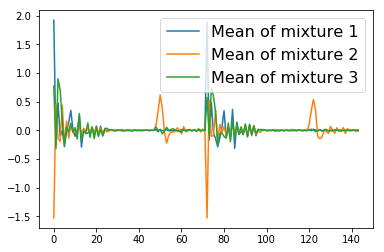

In [37]:
for k in range(3):
    plot(gmm.means_[k], linewidth=1.5, label="Mean of mixture {}".format(k+1))
legend(prop={"size": 16})

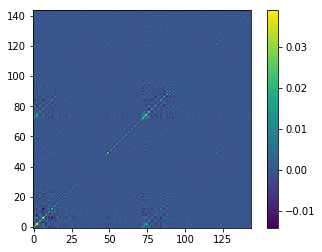

In [38]:
imshow(gmm.covariances_[0], origin="bottom left")
colorbar()

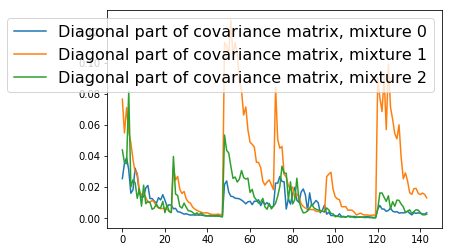

In [39]:
for k in range(3):
    plot(np.diag(gmm.covariances_[k]), linewidth=1.5, 
         label="Diagonal part of covariance matrix, mixture {}".format(k))
legend(prop={"size": 16})

In [40]:
def test_one_utt(src_path, tgt_path, disable_mlpg=False, diffvc=True):
    # GMM-based parameter generation is provided by the library in `baseline` module
    if disable_mlpg:
        # Force disable MLPG
        paramgen = MLPG(gmm, windows=[(0,0, np.array([1.0]))], diff=diffvc)
    else:
        paramgen = MLPG(gmm, windows=windows, diff=diffvc)

    x, frame_sample = librosa.load(src_path, sr=fs, dtype=float64)
    f0, timeaxis = pyworld.dio(x, frame_sample, frame_period=frame_period)
    f0 = pyworld.stonemask(x, f0, timeaxis, frame_sample)
    spectrogram = pyworld.cheaptrick(x, f0, timeaxis, frame_sample)
    aperiodicity = pyworld.d4c(x, f0, timeaxis, frame_sample)

    mc = pysptk.sp2mc(spectrogram, order=order, alpha=alpha)
    c0, mc = mc[:, 0], mc[:, 1:]
    if use_delta:
        mc = delta_features(mc, windows)
    mc = paramgen.transform(mc)
    if disable_mlpg and mc.shape[-1] != static_dim:
        mc = mc[:,:static_dim]
    assert mc.shape[-1] == static_dim
    mc = np.hstack((c0[:, None], mc))
    if diffvc:
        mc[:, 0] = 0 # remove power coefficients
        engine = Synthesizer(MLSADF(order=order, alpha=alpha), hopsize=hop_length)
        b = pysptk.mc2b(mc.astype(np.float64), alpha=alpha)
        waveform = engine.synthesis(x, b)
    else:
        spectrogram = pysptk.mc2sp(
            mc.astype(np.float64), alpha=alpha, fftlen=fftlen)
        waveform = pyworld.synthesize(
            f0, spectrogram, aperiodicity, frame_sample, frame_period)
        
    return waveform

Compare results with [this](http://people.tamu.edu/~guanlong.zhao/icassp18_demo.html)

In [41]:
EXP_ROOT = join(expanduser("~"), "Documents/em_lct/UoM/thesis/experiments/", "abi")
!ls $EXP_ROOT

female male


In [42]:
output_dir = join(EXP_ROOT, 'female/LAN')

for i, (src_path, tgt_path) in enumerate(zip(src_speaker.test_paths, tgt_speaker.test_paths)):
    print("{}-th sample".format(i+1))
    wo_MLPG = test_one_utt(src_path, tgt_path, disable_mlpg=True)
    w_MLPG = test_one_utt(src_path, tgt_path, disable_mlpg=False)
    src, _ = librosa.load(src_path, sr=fs, dtype=float64)
    tgt, _ = librosa.load(tgt_path, sr=fs, dtype=float64)
    
    file_name = splitext(basename(tgt_path))[0] # used for output; e.g. shortphrases_01
    
    print("Source:", basename(src_path))
    IPython.display.display(Audio(src, rate=fs))
    print("Target:", basename(tgt_path))
    IPython.display.display(Audio(tgt, rate=fs))
    print("w/o MLPG")
    IPython.display.display(Audio(wo_MLPG, rate=fs))
    wavfile.write(join(output_dir, (file_name + 'AC-wo_MLPG.wav')), fs, wo_MLPG)
    print("w/ MLPG")
    IPython.display.display(Audio(w_MLPG, rate=fs))
    wavfile.write(join(output_dir, (file_name + 'AC-w_MLPG.wav')), fs, w_MLPG)

1-th sample
Source: shortphrases_01.wav


Target: shortphrases_01.wav


w/o MLPG


w/ MLPG


2-th sample
Source: shortphrases_02.wav


Target: shortphrases_02.wav


w/o MLPG


w/ MLPG


3-th sample
Source: shortphrases_03.wav


Target: shortphrases_03.wav


w/o MLPG


w/ MLPG


4-th sample
Source: shortphrases_04.wav


Target: shortphrases_04.wav


w/o MLPG


w/ MLPG


5-th sample
Source: shortphrases_05.wav


Target: shortphrases_05.wav


w/o MLPG


w/ MLPG


6-th sample
Source: shortphrases_06.wav


Target: shortphrases_06.wav


w/o MLPG


w/ MLPG


7-th sample
Source: shortphrases_07.wav


Target: shortphrases_07.wav


w/o MLPG


w/ MLPG


8-th sample
Source: shortphrases_08.wav


Target: shortphrases_08.wav


w/o MLPG


w/ MLPG


9-th sample
Source: shortphrases_09.wav


Target: shortphrases_09.wav


w/o MLPG


w/ MLPG


10-th sample
Source: shortphrases_10.wav


Target: shortphrases_10.wav


w/o MLPG


w/ MLPG


11-th sample
Source: shortphrases_11.wav


Target: shortphrases_11.wav


w/o MLPG


w/ MLPG


12-th sample
Source: shortphrases_12.wav


Target: shortphrases_12.wav


w/o MLPG


w/ MLPG


13-th sample
Source: shortphrases_13.wav


Target: shortphrases_13.wav


w/o MLPG


w/ MLPG


14-th sample
Source: shortphrases_14.wav


Target: shortphrases_14.wav


w/o MLPG


w/ MLPG


15-th sample
Source: shortphrases_15.wav


Target: shortphrases_15.wav


w/o MLPG


w/ MLPG


16-th sample
Source: shortphrases_16.wav


Target: shortphrases_16.wav


w/o MLPG


w/ MLPG


17-th sample
Source: shortphrases_17.wav


Target: shortphrases_17.wav


w/o MLPG


w/ MLPG


18-th sample
Source: shortphrases_18.wav


Target: shortphrases_18.wav


w/o MLPG


w/ MLPG


19-th sample
Source: shortsentences_01.wav


Target: shortsentences_01.wav


w/o MLPG


w/ MLPG


20-th sample
Source: shortsentences_02.wav


Target: shortsentences_02.wav


w/o MLPG


w/ MLPG


21-th sample
Source: shortsentences_03.wav


Target: shortsentences_03.wav


w/o MLPG


w/ MLPG


22-th sample
Source: shortsentences_04.wav


Target: shortsentences_04.wav


w/o MLPG


w/ MLPG


23-th sample
Source: shortsentences_05.wav


Target: shortsentences_05.wav


w/o MLPG


w/ MLPG


24-th sample
Source: shortsentences_06.wav


Target: shortsentences_06.wav


w/o MLPG


w/ MLPG


25-th sample
Source: shortsentences_07.wav


Target: shortsentences_07.wav


w/o MLPG


w/ MLPG


26-th sample
Source: shortsentences_08.wav


Target: shortsentences_08.wav


w/o MLPG


w/ MLPG


27-th sample
Source: shortsentences_09.wav


Target: shortsentences_09.wav


w/o MLPG


w/ MLPG


28-th sample
Source: shortsentences_10.wav


Target: shortsentences_10.wav


w/o MLPG


w/ MLPG


29-th sample
Source: shortsentences_11.wav


Target: shortsentences_11.wav


w/o MLPG


w/ MLPG


30-th sample
Source: shortsentences_12.wav


Target: shortsentences_12.wav


w/o MLPG


w/ MLPG


31-th sample
Source: shortsentences_13.wav


Target: shortsentences_13.wav


w/o MLPG


w/ MLPG


32-th sample
Source: shortsentences_14.wav


Target: shortsentences_14.wav


w/o MLPG


w/ MLPG


33-th sample
Source: shortsentences_15.wav


Target: shortsentences_15.wav


w/o MLPG


w/ MLPG


34-th sample
Source: shortsentences_16.wav


Target: shortsentences_16.wav


w/o MLPG


w/ MLPG


35-th sample
Source: shortsentences_17.wav


Target: shortsentences_17.wav


w/o MLPG


w/ MLPG


36-th sample
Source: shortsentences_18.wav


Target: shortsentences_18.wav


w/o MLPG


w/ MLPG


37-th sample
Source: shortsentences_19.wav


Target: shortsentences_19.wav


w/o MLPG


w/ MLPG


38-th sample
Source: shortsentences_20.wav


Target: shortsentences_20.wav


w/o MLPG


w/ MLPG


In [43]:
def vis_difference(x, y, which_dims=[0,2,3,6,8], T_max=None):
    static_paramgen = MLPG(gmm, windows=[(0,0, np.array([1.0]))], diff=False)
    paramgen = MLPG(gmm, windows=windows, diff=False)

    x = trim_zeros_frames(x)
    y = trim_zeros_frames(y)[:,:static_dim]
    y_hat1 = static_paramgen.transform(x)[:,:static_dim]
    y_hat2 = paramgen.transform(x)

    if T_max is not None and len(y) > T_max:
        y,y_hat1,y_hat2 = y[:T_max],y_hat1[:T_max],y_hat2[:T_max]
        
    figure(figsize=(16,4*len(which_dims)))
    for idx, which_dim in enumerate(which_dims):
        subplot(len(which_dims), 1, idx+1)
        plot(y[:,which_dim], "--", linewidth=1, label="Target")
        plot(y_hat1[:,which_dim], "-", linewidth=2, label="w/o MLPG")
        plot(y_hat2[:,which_dim], "-", linewidth=3, label="w/ MLPG")
        title("{}-th coef".format(which_dim+1), fontsize=16)
        legend(prop={"size": 16}, loc="upper right")

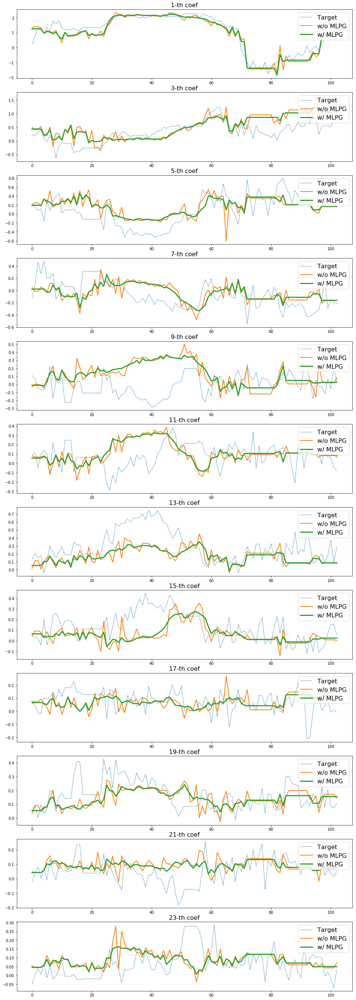

In [44]:
idx = 0
which_dims = np.arange(0, static_dim, step=2)
vis_difference(X_aligned[idx], Y_aligned[idx], T_max=300, which_dims=which_dims)